## Dataset integration using scANVI

In [1]:
# check GPU availability
import torch
print(f"Test GPU availability: {torch.cuda.is_available()}")

print("Import packages")
from pathlib import Path
import scanpy as sc
import pandas as pd
import numpy as np
import scvi

Test GPU availability: True
Import packages


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


## Reload after celltypist run

In [2]:
data_path = Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/celltypist/results_5000_1e2.h5ad")
adata = sc.read(data_path)

In [3]:
adata

AnnData object with n_obs × n_vars = 673379 × 280
    obs: 'original_cell_id', 'centroid_x', 'centroid_y', 'centroid_z', 'fov', 'cluster', 'volume', 'scale', 'population', 'n_genes_by_counts', 'total_counts', 'n_counts', 'n_genes', 'uid', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'majority_voting_simple'
    var: 'gene_names', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'neighbors', 'over_clustering'
    obsm: 'X_pca', 'spatial'
    layers: 'counts', 'norm_counts'
    obsp: 'connectivities', 'distances'

In [36]:
scanvi_labels_key = "predicted_labels"
min_counts = int(adata.obs[scanvi_labels_key].value_counts().min())
if min_counts < 100:
    n_samples_per_label = 100
else:
    n_samples_per_label = min_counts

In [37]:
n_samples_per_label

100

In [30]:
adata.obs["majority_voting_simple"].value_counts()

majority_voting_simple
Cancer cell         318558
Fibroblast           88299
Macrophage           49507
CD4                  42370
CD8                  34503
Plasma cell          31430
Dendritic cell       29182
Endothelial cell     26115
B cell               21936
Treg                 15601
Monocyte              6759
Pericyte              5393
Mast cell             1748
Schwann cell          1039
Enteroendocrine        939
Name: count, dtype: int64

In [4]:
adata.obs["majority_voting"]

c20dbd1b-3               Fibroblast
c20dbd1b-4                      CD8
c20dbd1b-5                     CRLM
c20dbd1b-6              Plasma cell
c20dbd1b-7                Mast cell
                         ...       
4e08eb69-231139    Endothelial cell
4e08eb69-231147         Cancer cell
4e08eb69-231155         Cancer cell
4e08eb69-231180         Cancer cell
4e08eb69-231189         Cancer cell
Name: majority_voting, Length: 673379, dtype: category
Categories (16, object): ['B cell', 'CD4', 'CD8', 'CRLM', ..., 'Pericyte', 'Plasma cell', 'Schwann cell', 'Treg']

In [5]:
adata.obs["majority_voting"].value_counts()

majority_voting
Cancer cell         213149
CRLM                105409
Fibroblast           88299
Macrophage           49507
CD4                  42370
CD8                  34503
Plasma cell          31430
Dendritic cell       29182
Endothelial cell     26115
B cell               21936
Treg                 15601
Monocyte              6759
Pericyte              5393
Mast cell             1748
Schwann cell          1039
Enteroendocrine        939
Name: count, dtype: int64

# Perform dimensionality reduction and clustering before batch correction

`nohup python CRC07_dim_reduction.py &> umap.out &`

# Batch correction with scANVI

Following command can be used in the terminal to perform the analysis:
`nohup python CRC08_scANVI.py &> scanvi.out &`

## Evaluate the models

It is recommended to check the loss function for overfitting:
- https://docs.scvi-tools.org/en/stable/tutorials/notebooks/scrna/scanvi_fix.html
- https://discourse.scverse.org/t/model-training-got-only-2-epochs/3284/3
- https://discourse.scverse.org/t/insufficient-batch-correction-for-certain-cell-types/2237/6
- https://discourse.scverse.org/t/how-to-compare-different-parameter-sets-using-the-validation-loss/2017/5

How to activate validation
- https://discourse.scverse.org/t/model-doesnt-contain-validation-metrics/1814

In [2]:
import scvi
import scanpy as sc
import pandas as pd
from pathlib import Path

In [3]:
path_dict = {
    "majority_voting": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__results_5000_1e2__majority_voting__nb_gene-batch_100_50/"),
    "majority_voting_simple": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__results_5000_1e2__majority_voting_simple__nb_gene-batch_100_50/"),
    "predicted_labels": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__results_5000_1e2__predicted_labels__nb_gene-batch_100_50/"),
    "majority_voting-rounded": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__results_5000_rounded_1e2__majority_voting__nb_gene-batch_100_50"),
    "predicted_labels-rounded-gpu": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__celltypist_rounded_5000_1e2__predicted_labels__nb_gene-batch_100_50/"),
    "majority_voting_simple-rounded-gpu": Path("/dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__celltypist_rounded_5000_1e2__majority_voting_simple__nb_gene-batch_100_50/")
}

In [4]:
adatas = {k: sc.read(p / "scanvi.h5ad") for k, p in path_dict.items()}

In [5]:
adatas

{'majority_voting': AnnData object with n_obs × n_vars = 673379 × 280
     obs: 'original_cell_id', 'centroid_x', 'centroid_y', 'centroid_z', 'fov', 'cluster', 'volume', 'scale', 'population', 'n_genes_by_counts', 'total_counts', 'n_counts', 'n_genes', 'uid', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'majority_voting_simple', '_scvi_batch', '_scvi_labels'
     var: 'gene_names', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
     uns: 'X_umap_scanvi', 'X_umap_scvi', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'neighbors_scanvi', 'neighbors_scvi', 'over_clustering', 'pca', 'umap'
     obsm: 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap', 'X_umap_scanvi', 'X_umap_scvi', 'spatial'
     varm: 'PCs'
     layers: 'counts', 'norm_counts'
     obsp: 'connectivities', 'distances', 'neighbors_scanvi_connectivities', 'neighbors_scanvi_distances', 'neighbors_scvi_connectivities', 'neighbors_scvi_distances',
 'majority_voting_simple'

In [6]:
scvi_models = {k: scvi.model.SCVI.load(p / "scVI_model", adatas[k]) for k, p in path_dict.items()}

INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__majority_voting__nb_gene-batch_100_50/scVI_model/model.pt already downloaded                  


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__majority_voting_simple__nb_gene-batch_100_50/scVI_model/model.pt already downloaded           


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__predicted_labels__nb_gene-batch_100_50/scVI_model/model.pt already downloaded                 


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_rounded_1e2__majority_voting__nb_gene-batch_100_50/scVI_model/model.pt already downloaded          
INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__ce
         lltypist_rounded_5000_1e2__predicted_labels__nb_gene-batch_100_50/scVI_model/model.pt already downloaded  
INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__ce
         lltypist_rounded_5000_1e2__majority_voting_simple__nb_gene-batc

In [7]:
scanvi_models = {k: scvi.model.SCANVI.load(p / "scANVI_model", adatas[k]) for k, p in path_dict.items()}

INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__majority_voting__nb_gene-batch_100_50/scANVI_model/model.pt already downloaded                


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__majority_voting_simple__nb_gene-batch_100_50/scANVI_model/model.pt already downloaded         


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_1e2__predicted_labels__nb_gene-batch_100_50/scANVI_model/model.pt already downloaded               


/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_base_field.py:63: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results__result
         s_5000_rounded_1e2__majority_voting__nb_gene-batch_100_50/scANVI_model/model.pt already downloaded        
INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__ce
         lltypist_rounded_5000_1e2__predicted_labels__nb_gene-batch_100_50/scANVI_model/model.pt already downloaded
INFO     File                                                                                                      
         /dss/dssfs02/lwp-dss-0001/pn57fo/pn57fo-dss-0000/projects/2301-CRC/scANVI_batch_correction/results_gpu__ce
         lltypist_rounded_5000_1e2__majority_voting_simple__nb_gene-batc

In [8]:
scvi_models

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

SCVI model with the following parameters: 
n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, gene_likelihood: nb, 
latent_distribution: normal.
Training status: Trained
Model's adata is minified?: False

{'majority_voting': ,
 'majority_voting_simple': ,
 'predicted_labels': ,
 'majority_voting-rounded': ,
 'predicted_labels-rounded-gpu': ,
 'majority_voting_simple-rounded-gpu': }

In [9]:
scanvi_models

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene-batch, 
gene_likelihood: nb
Training status: Trained
Model's adata is minified?: False

{'majority_voting': ,
 'majority_voting_simple': ,
 'predicted_labels': ,
 'majority_voting-rounded': ,
 'predicted_labels-rounded-gpu': ,
 'majority_voting_simple-rounded-gpu': }

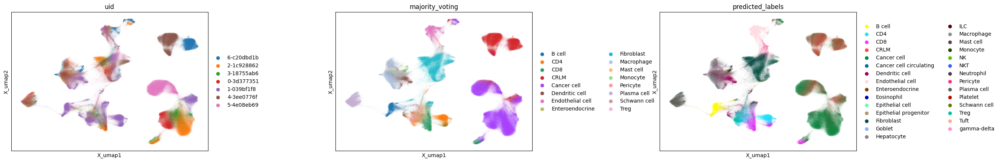

In [12]:
sc.pl.embedding(
    adatas[list(adatas.keys())[0]],
    basis="X_umap",
    color=["uid", "majority_voting", "predicted_labels"],
    ncols=3,
    wspace=0.5
    #save=outpath / "testumap.png"
)

majority_voting


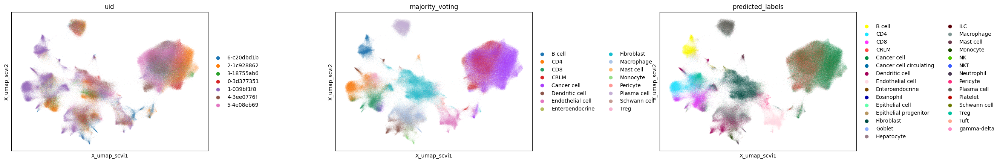

majority_voting_simple


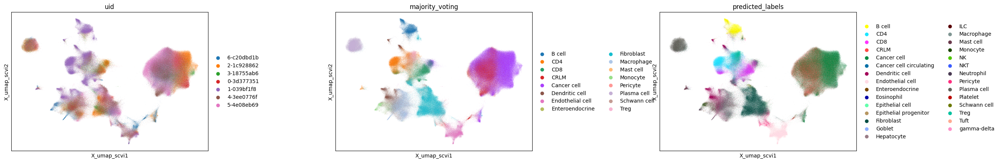

predicted_labels


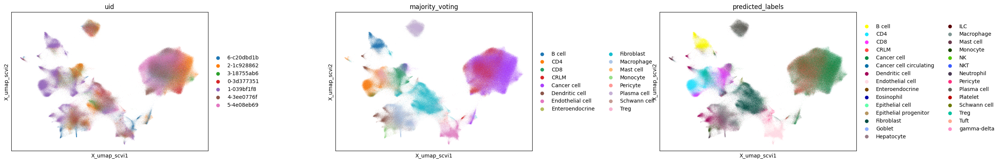

majority_voting-rounded


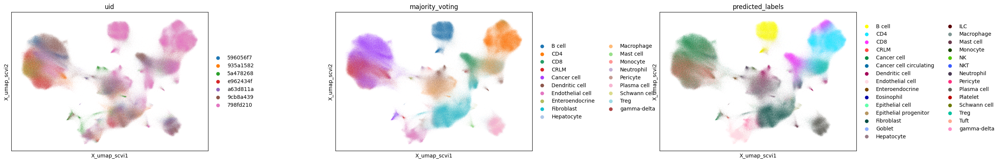

predicted_labels-rounded-gpu


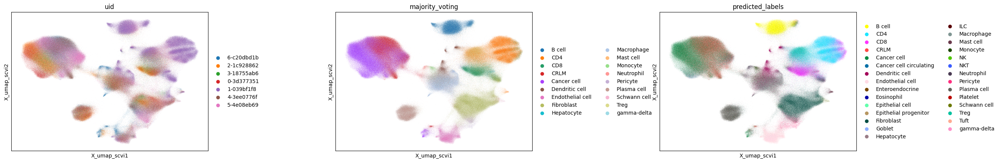

majority_voting_simple-rounded-gpu


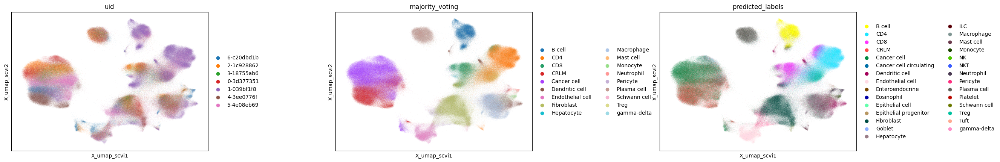

In [13]:
for k, adata in adatas.items():
    print(k)
    sc.pl.embedding(
        adata,
        basis="X_umap_scvi",
        color=["uid", "majority_voting", "predicted_labels"],
        ncols=3,
        wspace=0.5
        #save=outpath / "testumap.png"
    )

majority_voting


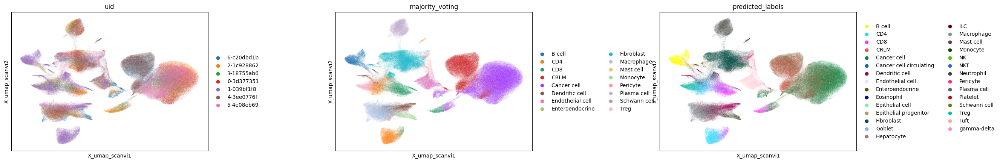

majority_voting_simple


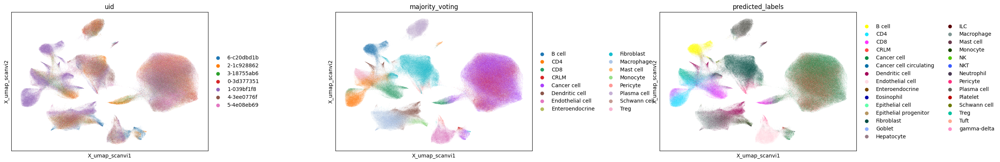

predicted_labels


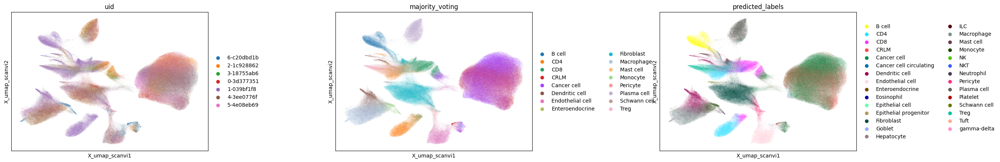

majority_voting-rounded


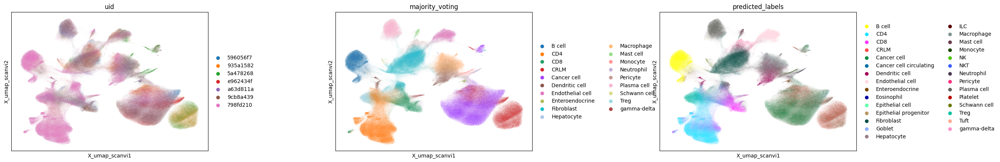

predicted_labels-rounded-gpu


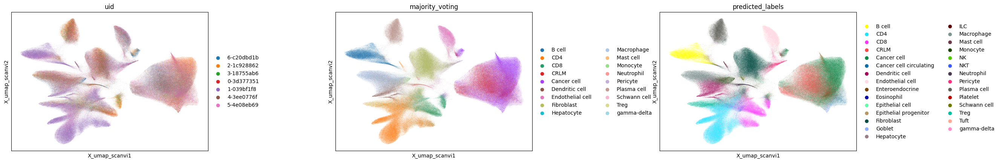

majority_voting_simple-rounded-gpu


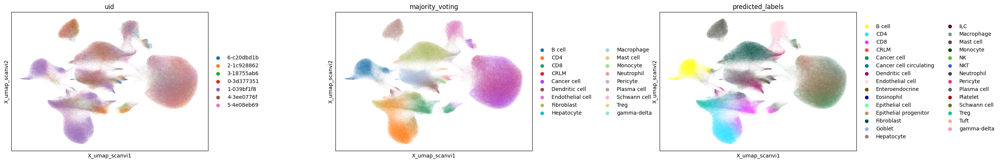

In [14]:
for k, adata in adatas.items():
    print(k)
    sc.pl.embedding(
        adata,
        basis="X_umap_scanvi",
        color=["uid", "majority_voting", "predicted_labels"],
        ncols=3,
        wspace=0.5
        #save=outpath / "testumap.png"
    )

In [16]:
adatas["majority_voting-rounded"]

AnnData object with n_obs × n_vars = 1252882 × 280
    obs: 'centroid_x', 'centroid_y', 'centroid_z', 'fov', 'cluster', 'volume', 'population', 'n_genes_by_counts', 'total_counts', 'n_genes', 'uid', 'n_counts', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', '_scvi_batch', '_scvi_labels'
    var: 'gene_names', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'X_umap_scanvi', 'X_umap_scvi', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'neighbors_scanvi', 'neighbors_scvi', 'over_clustering', 'pca', 'umap', 'uid_colors', 'majority_voting_colors', 'predicted_labels_colors'
    obsm: 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap', 'X_umap_scanvi', 'X_umap_scvi', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'norm_counts'
    obsp: 'connectivities', 'distances', 'neighbors_scanvi_connectivities', 'neighbors_scanvi_distances', 'neighbors_scvi_connectivities', 'neighbors_scvi_distances'

In [17]:
adatas["majority_voting"]

AnnData object with n_obs × n_vars = 673379 × 280
    obs: 'original_cell_id', 'centroid_x', 'centroid_y', 'centroid_z', 'fov', 'cluster', 'volume', 'scale', 'population', 'n_genes_by_counts', 'total_counts', 'n_counts', 'n_genes', 'uid', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'majority_voting_simple', '_scvi_batch', '_scvi_labels'
    var: 'gene_names', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'X_umap_scanvi', 'X_umap_scvi', '_scvi_manager_uuid', '_scvi_uuid', 'log1p', 'neighbors', 'neighbors_scanvi', 'neighbors_scvi', 'over_clustering', 'pca', 'umap', 'uid_colors', 'majority_voting_colors', 'predicted_labels_colors'
    obsm: 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap', 'X_umap_scanvi', 'X_umap_scvi', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'norm_counts'
    obsp: 'connectivities', 'distances', 'neighbors_scanvi_connectivities', 'neighbors_scanvi_distances', 'neighbors_scvi_connectivities', 'neighbors_sc

In [15]:
scvi_model.history.keys()

dict_keys(['kl_weight', 'train_loss_step', 'validation_loss', 'elbo_validation', 'reconstruction_loss_validation', 'kl_local_validation', 'kl_global_validation', 'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 'kl_local_train', 'kl_global_train'])

In [16]:
scanvi_model.history.keys()

dict_keys(['train_loss_step', 'validation_loss', 'elbo_validation', 'reconstruction_loss_validation', 'kl_local_validation', 'kl_global_validation', 'validation_classification_loss', 'validation_accuracy', 'validation_f1_score', 'validation_calibration_error', 'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 'kl_local_train', 'kl_global_train', 'train_classification_loss', 'train_accuracy', 'train_f1_score', 'train_calibration_error'])

In [31]:
import matplotlib.pyplot as plt
def plot_history(history):
    """
    Plots the different parameters over time in line plots for specified groups in the scanvi_model.history.
    
    Parameters:
    history (dict): A dictionary where keys are parameter names and values are pandas dataframes containing the parameter values over time.
    """
    # Define groups
    groups = {
        'elbo': [elem for elem in history.keys() if 'elbo' in elem],
        'reconstruction_loss': [elem for elem in history.keys() if 'reconstruction_loss' in elem],
        'loss_step': ['train_loss_step', 'train_loss_epoch'],
        'accuracy': [elem for elem in history.keys() if 'accuracy' in elem],
        'calibration_error': [elem for elem in history.keys() if 'calibration_error' in elem],
        'kl_local': [elem for elem in history.keys() if 'kl_local' in elem],
        'kl_global': [elem for elem in history.keys() if 'kl_global' in elem],
    }
    
    # Create a figure and axis for each group
    fig, axes = plt.subplots(nrows=1, ncols=len(groups), figsize=(5*len(groups), 5))
    
    # Plot each group
    for i, (group_name, keys) in enumerate(groups.items()):
        ax = axes[i]
        for key in keys:
            if key in history:
                ax.plot(history[key], label=key)
        ax.set_title(f'Model History - {group_name}')
        ax.set_xlabel('Time')
        ax.set_ylabel('Value')
        ax.legend()
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [32]:
model.history.keys()

dict_keys(['train_loss_step', 'validation_loss', 'elbo_validation', 'reconstruction_loss_validation', 'kl_local_validation', 'kl_global_validation', 'validation_classification_loss', 'validation_accuracy', 'validation_f1_score', 'validation_calibration_error', 'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 'kl_local_train', 'kl_global_train', 'train_classification_loss', 'train_accuracy', 'train_f1_score', 'train_calibration_error'])

majority_voting


/tmp/ipykernel_902930/3249535279.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


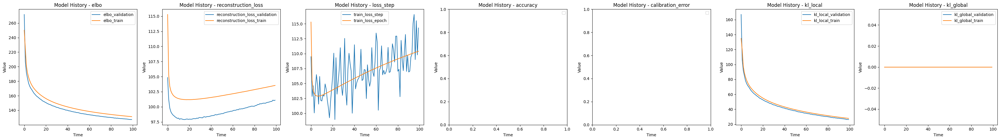

majority_voting_simple


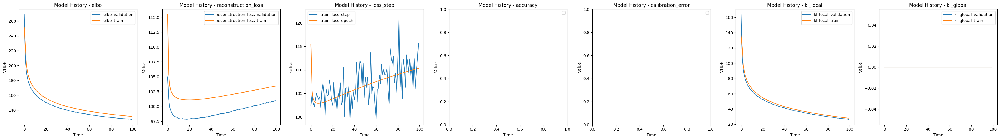

predicted_labels


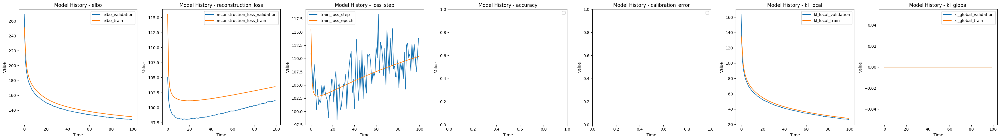

majority_voting-rounded


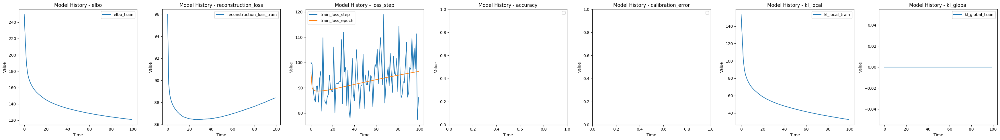

predicted_labels-rounded-gpu


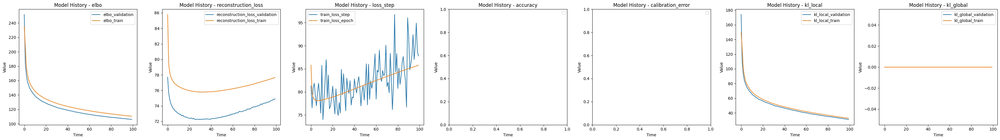

majority_voting_simple-rounded-gpu


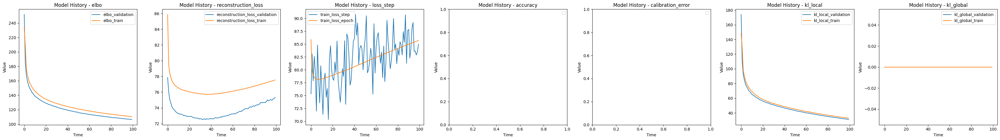

In [33]:
for k, model in scvi_models.items():
    print(k)
    plot_history(model.history)

majority_voting


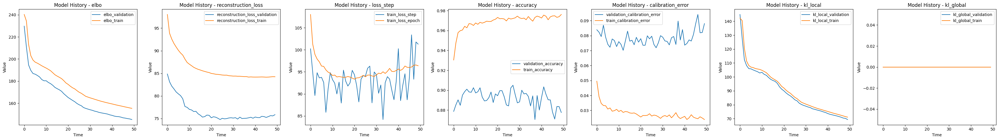

majority_voting_simple


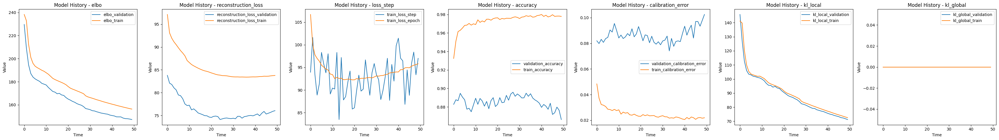

predicted_labels


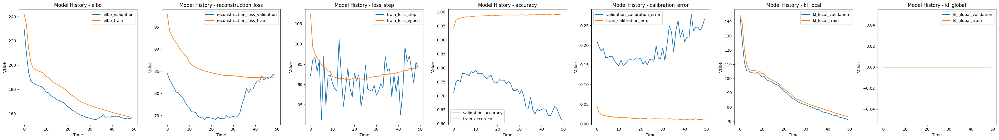

majority_voting-rounded


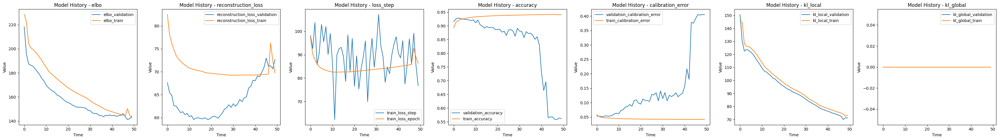

predicted_labels-rounded-gpu


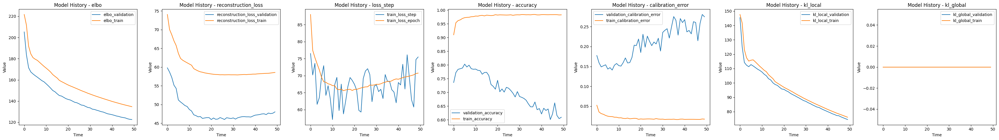

majority_voting_simple-rounded-gpu


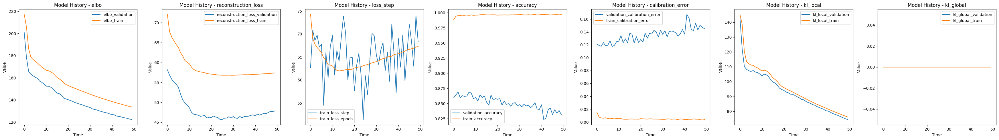

In [34]:
for k, model in scanvi_models.items():
    print(k)
    plot_history(model.history)

In [24]:
model.history.keys()

dict_keys(['train_loss_step', 'validation_loss', 'elbo_validation', 'reconstruction_loss_validation', 'kl_local_validation', 'kl_global_validation', 'validation_classification_loss', 'validation_accuracy', 'validation_f1_score', 'validation_calibration_error', 'train_loss_epoch', 'elbo_train', 'reconstruction_loss_train', 'kl_local_train', 'kl_global_train', 'train_classification_loss', 'train_accuracy', 'train_f1_score', 'train_calibration_error'])

In [5]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="uid")

model = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 400/400: 100%|██████████| 400/400 [01:36<00:00,  4.33it/s, v_num=1, train_loss_step=137, train_loss_epoch=117] 

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:36<00:00,  4.13it/s, v_num=1, train_loss_step=137, train_loss_epoch=117]


### Get latent representation

In [16]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

### Cluster dataset

In [17]:
scvi_neighbor_key = "neighbors_scvi"
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY, key_added=scvi_neighbor_key)
sc.tl.leiden(adata, neighbors_key=scvi_neighbor_key, key_added="leiden_scvi")
sc.tl.umap(adata, neighbors_key=scvi_neighbor_key, key_added="X_umap_scvi", min_dist=0.3)

In [18]:
adata

AnnData object with n_obs × n_vars = 1000 × 280
    obs: 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'n_genes_by_counts', 'n_genes', 'uid', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', '_scvi_batch', '_scvi_labels', 'leiden_scvi'
    var: 'gene_names'
    uns: 'log1p', 'neighbors', 'over_clustering', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors_scvi', 'leiden_scvi', 'X_umap_scvi', 'uid_colors', 'leiden_scvi_colors', 'majority_voting_colors', 'predicted_labels_colors'
    obsm: 'X_pca', 'spatial', 'X_scVI', 'X_umap_scvi'
    layers: 'counts', 'norm_counts', 'scaled_log1p'
    obsp: 'connectivities', 'distances', 'neighbors_scvi_distances', 'neighbors_scvi_connectivities'

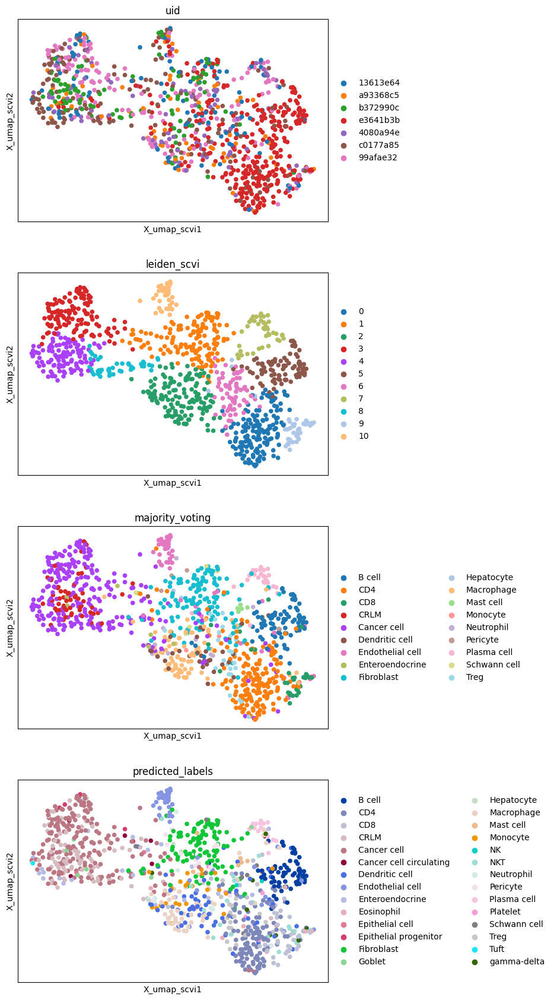

In [19]:
sc.pl.embedding(
    adata,
    basis="X_umap_scvi",
    color=["uid", "leiden_scvi", "majority_voting", "predicted_labels"],
    ncols=1,
)

In [32]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="majority_voting",
    unlabeled_category="Unknown",
)

/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 9 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/scvi/data/fields/_scanvi.py:55: UserWarning: Category 9 in adata.obs['_scvi_labels'] has fewer than 3 cells. Models may not train properly.
  mapping = _make_column_categorical(


In [33]:
scanvi_model

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 30, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Not Trained
Model's adata is minified?: False

In [34]:
scanvi_model.train(
    max_epochs=50, 
    #n_samples_per_label=100
)

INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=5` in the `DataLoader` to improve performance.
/dss/dsshome1/0C/ge37voy2/miniconda3/envs/scvi/lib/python3.12/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 10/10: 100%|██████████| 10/10 [00:06<00:00,  1.60it/s, v_num=1, train_loss_step=221, train_loss_epoch=147]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|██████████| 10/10 [00:06<00:00,  1.53it/s, v_num=1, train_loss_step=221, train_loss_epoch=147]


### Get latent representation

In [35]:
SCANVI_LATENT_KEY = "X_scANVI"
adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation(adata)

In [36]:
scanvi_neighbors_key = "neighbors_scanvi"
sc.pp.neighbors(adata, use_rep=SCANVI_LATENT_KEY, key_added=scanvi_neighbors_key)
sc.tl.umap(adata, neighbors_key=scanvi_neighbors_key, key_added="X_umap_scanvi", min_dist=0.3)

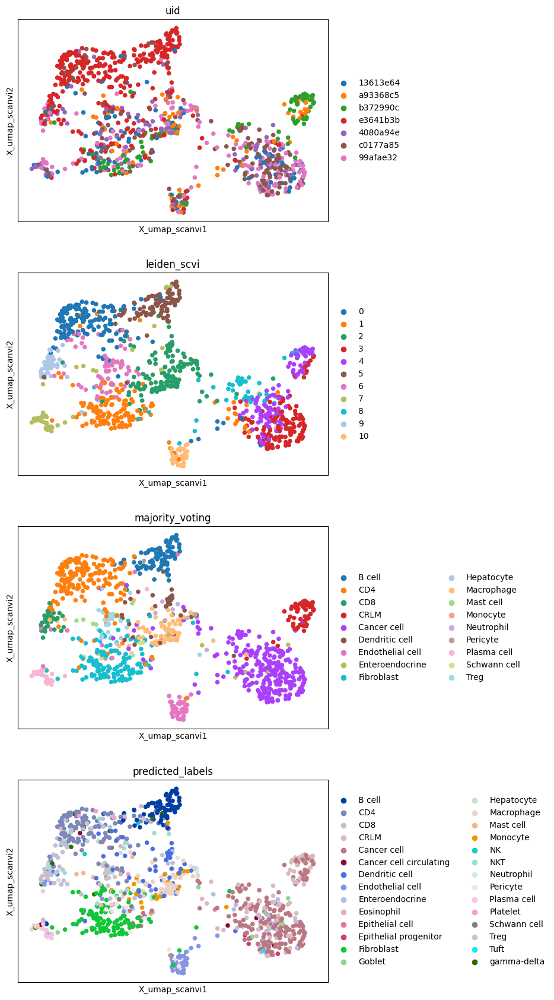

In [37]:
sc.pl.embedding(
    adata,
    basis="X_umap_scanvi",
    color=["uid", "leiden_scvi", "majority_voting", "predicted_labels"],
    ncols=1,
)

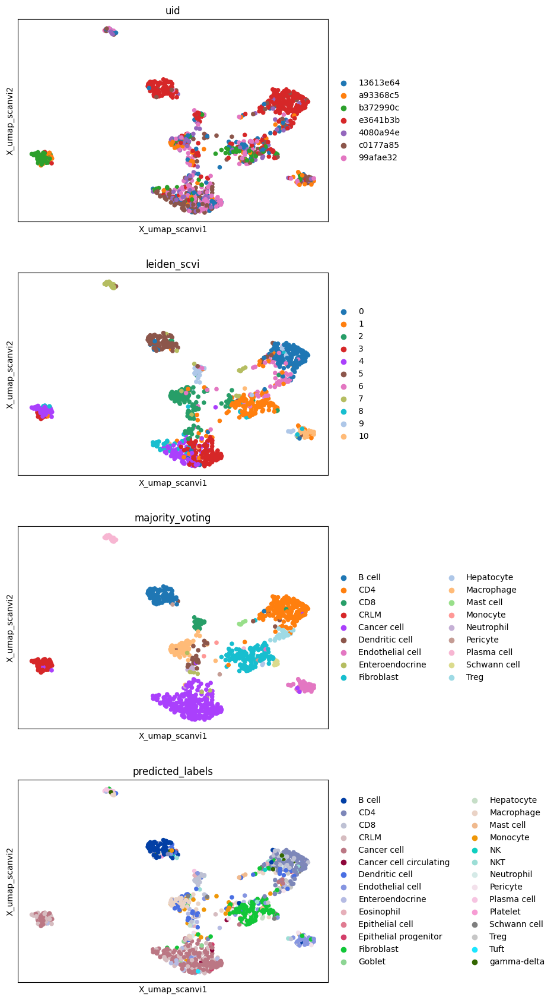

In [31]:
sc.pl.embedding(
    adata,
    basis="X_umap_scanvi",
    color=["uid", "leiden_scvi", "majority_voting", "predicted_labels"],
    ncols=1,
)

In [26]:
out_path = data_path.parent / "results_5000_scanvi.h5ad"
adata.write(out_path)